In [2]:
#load modules
import pandas as pd
import scanpy as sc
import numpy as np
import anndata
import os
from collections import Counter
from sklearn.decomposition import PCA


#ploting modules
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import anndata
from scipy import stats
import warnings
import logging

working_dic="/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering"
os.chdir(working_dic)

#color key define
dimplot_color=mcolors.LinearSegmentedColormap.from_list("custom_cmap", ["#E5E5E5","#4C4DB7"])

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.logging.print_version_and_date()
sc.settings.set_figure_params(dpi=100, color_map='RdBu_r')

sc.settings.verbosity = 1
warnings.filterwarnings('ignore')

# If you're using libraries like pandas, you can also set their display options
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)

mkdir -p failed for path /home/jovyan/.cache/matplotlib: [Errno 13] Permission denied: '/home/jovyan/.cache/matplotlib'
Matplotlib created a temporary cache directory at /tmp/matplotlib-c_szroex because there was an issue with the default path (/home/jovyan/.cache/matplotlib); it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


Running Scanpy 1.11.0, on 2025-05-19 13:21.


In [42]:
adata_initial=sc.read_h5ad('/data2/core-med1/elindber/PROJECTS/20231020_el_Xenotransplant/results/20240220_el_Xenotransplant_BR_IMMUNE_PIG_2ndIT_LEIDEN.h5ad')

In [51]:
pig_immune_raw = sc.read ("/data2/core-med1/elindber/PROJECTS/20231020_el_Xenotransplant/results/20240220_el_Xenotransplant_BR_IMMUNE_PIG_RAW.h5ad")

In [52]:
# Get the cell names that are in both objects
common_cells = adata_initial.obs_names

# Subset the raw object to keep only cells that are in the annotated object
pig_immune_raw_filtered = pig_immune_raw[pig_immune_raw.obs_names.isin(common_cells)].copy()

# Save the filtered raw object
pig_immune_raw_filtered.write("pig_immune_raw_filtered.h5ad")

# Verify that all cells match
print("Number of cells in filtered raw object:", pig_immune_raw_filtered.n_obs)
print("Number of cells in annotated object:", adata_initial.n_obs)

# Check if all cell names match exactly
all_match = all(pig_immune_raw_filtered.obs_names == adata_initial.obs_names)
print("Do all cell names match exactly between the two objects?", all_match)

# If not matching exactly (but should have same cells), you can check set equality
set_match = set(pig_immune_raw_filtered.obs_names) == set(adata_initial.obs_names)
print("Do the two objects contain exactly the same cells (order-independent)?", set_match)

# If order doesn't match but cells are the same, you can reorder the filtered raw object
if not all_match and set_match:
    pig_immune_raw_filtered = pig_immune_raw_filtered[adata_initial.obs_names, :].copy()
    print("Reordered filtered raw object to match annotated object")
    print("Now all cell names match exactly:", all(pig_immune_raw_filtered.obs_names == adata_initial.obs_names))

Number of cells in filtered raw object: 3759
Number of cells in annotated object: 3759
Do all cell names match exactly between the two objects? True
Do the two objects contain exactly the same cells (order-independent)? True


In [60]:
adata_initial = sc.read ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/pig_immune_raw_filtered.h5ad")

In [61]:
adata=adata_initial.copy()
adata.obs_names_make_unique()

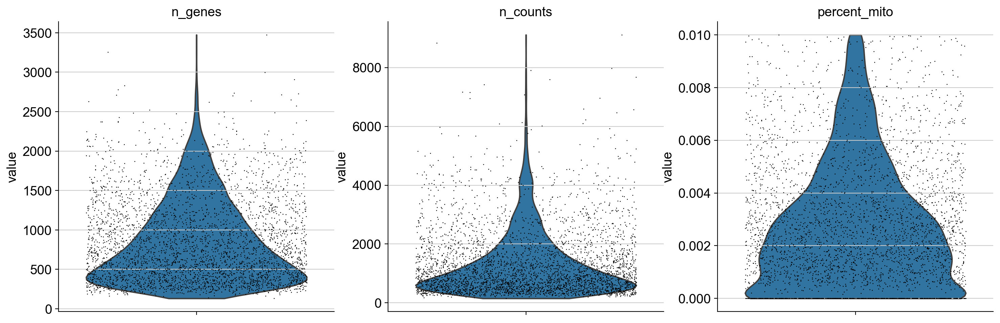

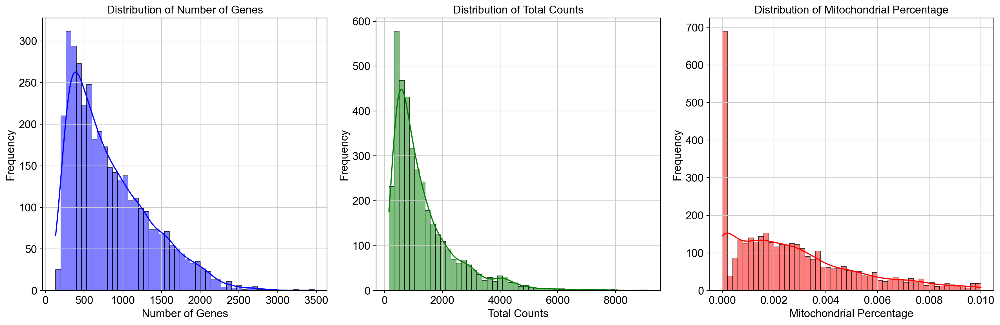

In [62]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)

sc.pl.violin(
    adata,
    ["n_genes", "n_counts", "percent_mito"],
    jitter=0.4,
    multi_panel=True)
# 1. Visualize the distribution of key variables (n_genes, n_counts, percent_mito)
# Plot the distribution of n_genes, n_counts, and percent_mito

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.histplot(adata.obs['n_genes'], kde=True, ax=axes[0], color='blue', bins=50)
axes[0].set_title('Distribution of Number of Genes')
axes[0].set_xlabel('Number of Genes')
axes[0].set_ylabel('Frequency')

sns.histplot(adata.obs['n_counts'], kde=True, ax=axes[1], color='green', bins=50)
axes[1].set_title('Distribution of Total Counts')
axes[1].set_xlabel('Total Counts')
axes[1].set_ylabel('Frequency')

sns.histplot(adata.obs['percent_mito'], kde=True, ax=axes[2], color='red', bins=50)
axes[2].set_title('Distribution of Mitochondrial Percentage')
axes[2].set_xlabel('Mitochondrial Percentage')
axes[2].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

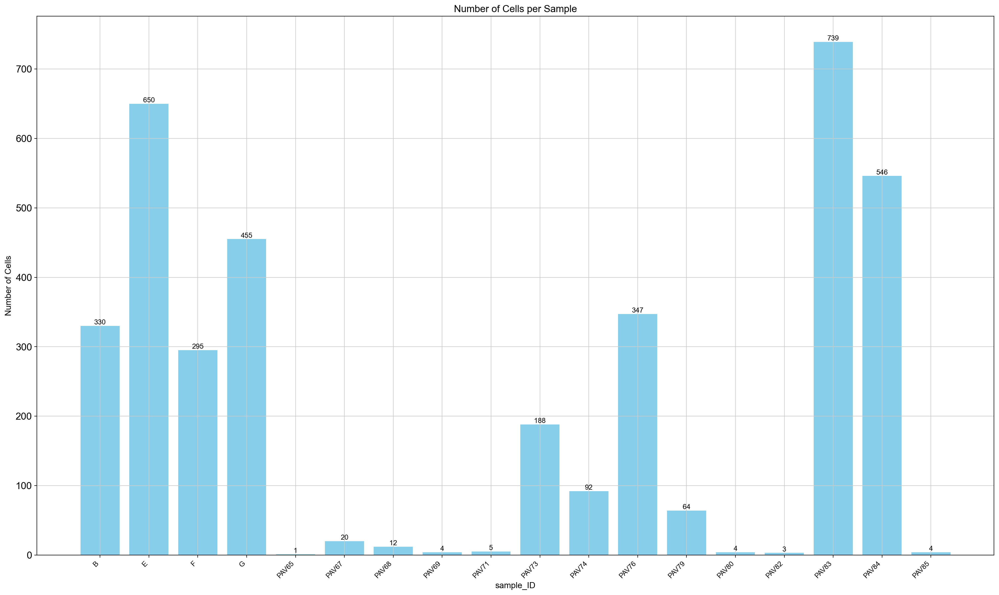

In [63]:
#check the number of nuclei after filters
sample_column = 'Sample_ID'
if sample_column not in adata.obs:
    raise ValueError(f"Column '{sample_column}' not found in adata.obs")

cell_counts = adata.obs[sample_column].value_counts()

cell_counts_df = pd.DataFrame({
    'Sample_ID': cell_counts.index,
    'Cell Count': cell_counts.values
}).sort_values(by='Sample_ID')

plt.figure(figsize=(20, 12))
bars = plt.bar(cell_counts_df['Sample_ID'], cell_counts_df['Cell Count'], color='skyblue')
plt.xlabel('sample_ID', fontsize=12)
plt.ylabel('Number of Cells', fontsize=12)
plt.title('Number of Cells per Sample', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(height), 
             ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

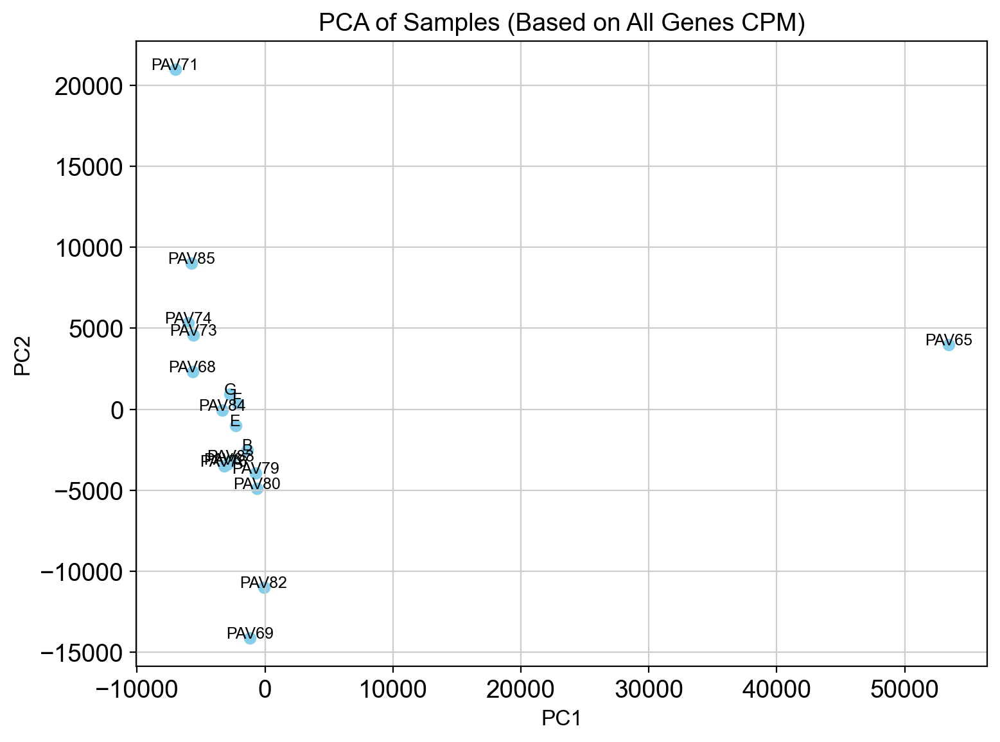

In [64]:
sample_column = 'Sample_ID'

if sample_column not in adata.obs:
    raise ValueError(f"Column '{sample_column}' not found in adata.obs")

gene_expression_sums = adata.obs.groupby(sample_column).apply(
    lambda df: adata[df.index, :].X.sum(axis=0)
)

gene_expression_sums = pd.DataFrame(
    data=np.vstack(gene_expression_sums.values),
    index=gene_expression_sums.index,
    columns=adata.var_names
)

total_expression_per_sample = gene_expression_sums.sum(axis=1)
cpm_normalized = gene_expression_sums.div(total_expression_per_sample, axis=0) * 1e6

pca = PCA(n_components=2)
pca_results = pca.fit_transform(cpm_normalized)

pca_df = pd.DataFrame(
    data=pca_results,
    columns=['PC1', 'PC2'],
    index=gene_expression_sums.index
)

plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], color='skyblue')
for i, sample in enumerate(pca_df.index):
    plt.text(pca_df.iloc[i, 0], pca_df.iloc[i, 1], sample, fontsize=9, ha='center')
plt.xlabel('PC1', fontsize=12)
plt.ylabel('PC2', fontsize=12)
plt.title('PCA of Samples (Based on All Genes CPM)', fontsize=14)
plt.tight_layout()
plt.show()

In [65]:
# Now saving a copy of adata (completely raw) as adata_afterinte to start further work without changing the adata format
adata_afterinte = adata.copy()

In [69]:
# Step 2: Preprocess - Normalize and Log Transform
sc.pp.normalize_total(adata_afterinte, target_sum=1e4)
sc.pp.log1p(adata_afterinte)

In [70]:
lognorm_adata_pre_hvg = adata_afterinte.write ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/lognorm_adata_pre_hvg.h5ad")

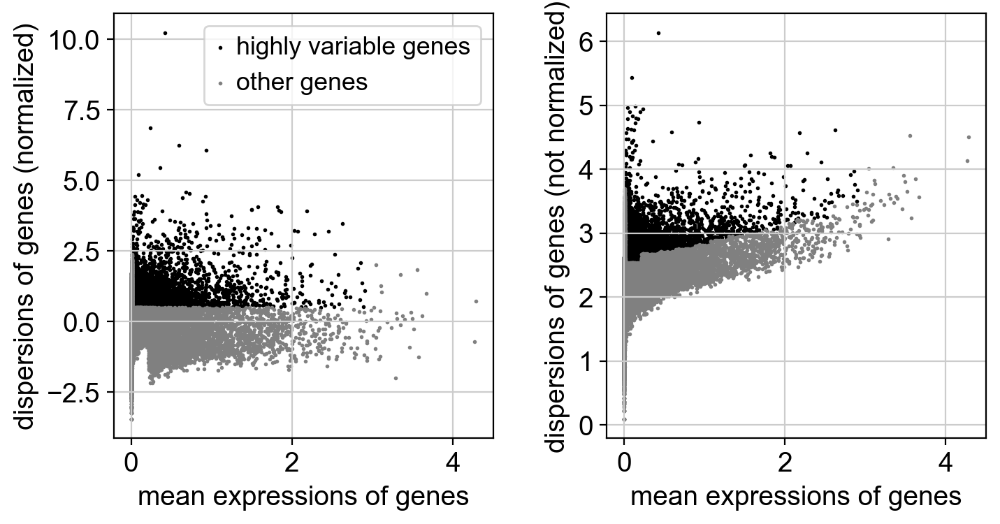

Number of highly variable genes (HVGs): 4882


In [77]:
# Identify highly variable genes
sc.pp.highly_variable_genes(adata_afterinte, min_mean=0.0125, max_mean=3, min_disp=0.5)

# Plot highly variable genes

sc.pl.highly_variable_genes(adata_afterinte)

# Count the number of highly variable genes
num_hvgs = adata_afterinte.var['highly_variable'].sum()

# Print the result
print(f"Number of highly variable genes (HVGs): {num_hvgs}")

In [78]:
sc.pp.scale(adata_afterinte, max_value=10)

In [82]:
# Subset the data to HVGs for dimensionality reduction and clustering
adata_hvg = adata_afterinte[:, adata_afterinte.var.highly_variable]

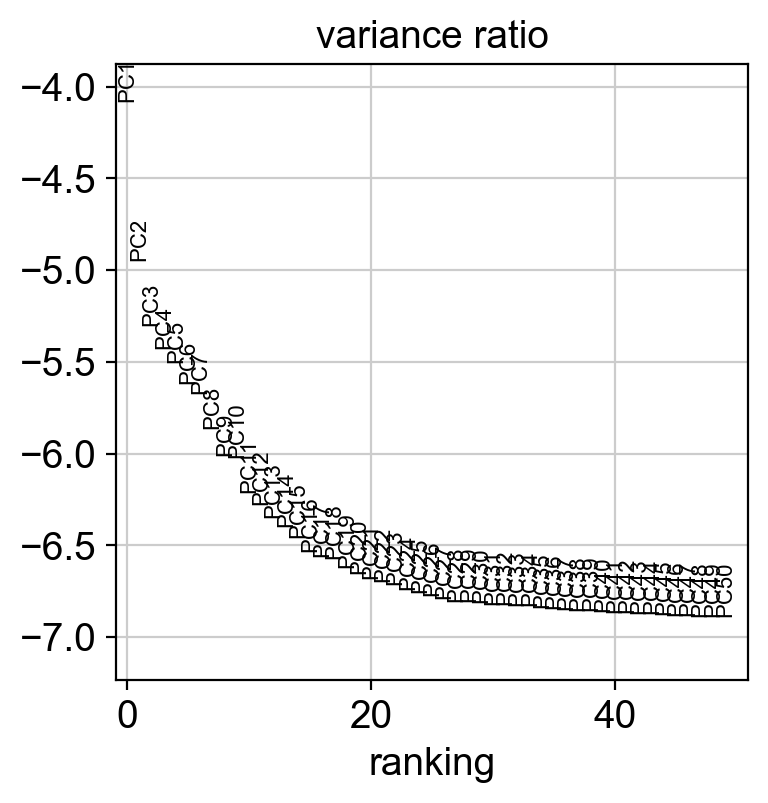

In [84]:
# Perform PCA
sc.tl.pca(adata_hvg, svd_solver='arpack')

# Plot the explained variance to decide how many PCs to use
sc.pl.pca_variance_ratio(adata_hvg, log=True, n_pcs=50)
plt.show()

2025-04-23 13:49:59,395 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-04-23 13:50:00,562 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-04-23 13:50:00,588 - harmonypy - INFO - Iteration 1 of 10
2025-04-23 13:50:01,896 - harmonypy - INFO - Iteration 2 of 10
2025-04-23 13:50:03,105 - harmonypy - INFO - Iteration 3 of 10
2025-04-23 13:50:04,307 - harmonypy - INFO - Iteration 4 of 10
2025-04-23 13:50:05,512 - harmonypy - INFO - Iteration 5 of 10
2025-04-23 13:50:06,720 - harmonypy - INFO - Iteration 6 of 10
2025-04-23 13:50:07,926 - harmonypy - INFO - Iteration 7 of 10
2025-04-23 13:50:09,131 - harmonypy - INFO - Iteration 8 of 10
2025-04-23 13:50:10,333 - harmonypy - INFO - Iteration 9 of 10
2025-04-23 13:50:11,540 - harmonypy - INFO - Iteration 10 of 10
2025-04-23 13:50:12,742 - harmonypy - INFO - Stopped before convergence


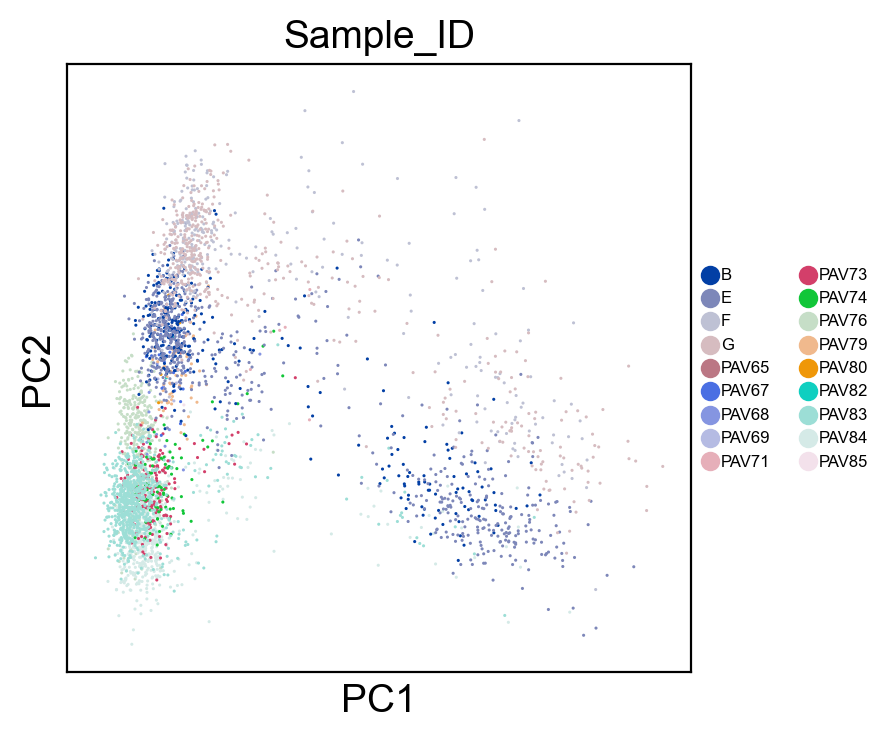

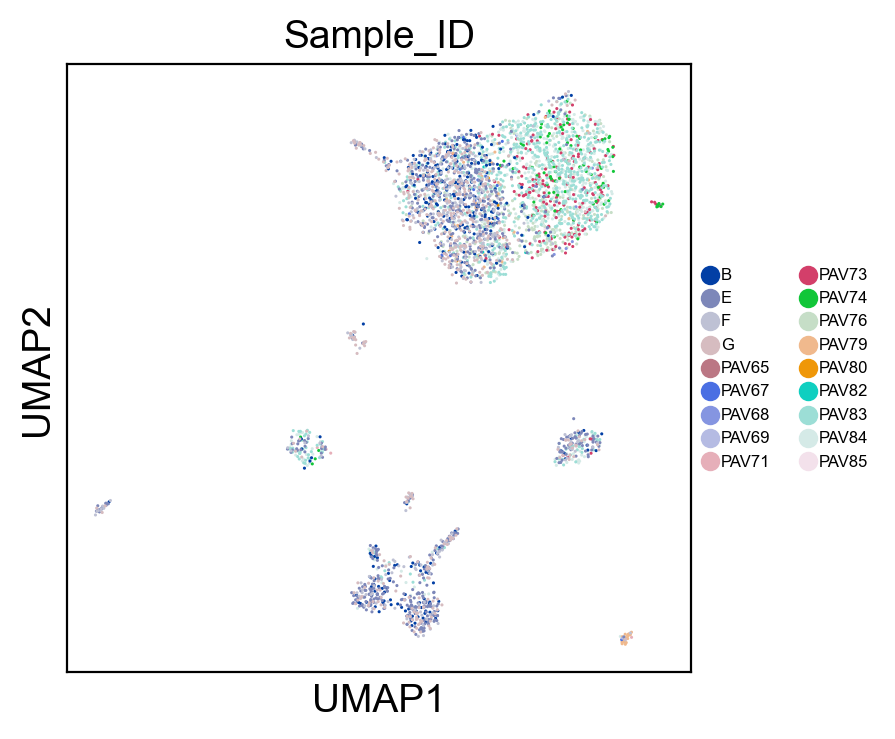

In [85]:
#run harmony
sc.external.pp.harmony_integrate(adata_hvg, "Sample_ID", random_state=15, epsilon_cluster=-np.inf, epsilon_harmony=-np.inf)

sc.pp.neighbors(adata_hvg, n_neighbors=20, n_pcs=30, use_rep="X_pca_harmony")
sc.tl.umap(adata_hvg)
sc.pl.pca_scatter(adata_hvg, color=["Sample_ID"], size=5, legend_fontsize=6)
sc.pl.umap(adata_hvg, color=["Sample_ID"], size=5, legend_fontsize=6)

In [86]:
hm_adata = adata_hvg.write ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/harmonized_cm_adata_v10.h5ad')

In [108]:
hm_adata = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/harmonized_cm_adata_v10.h5ad')

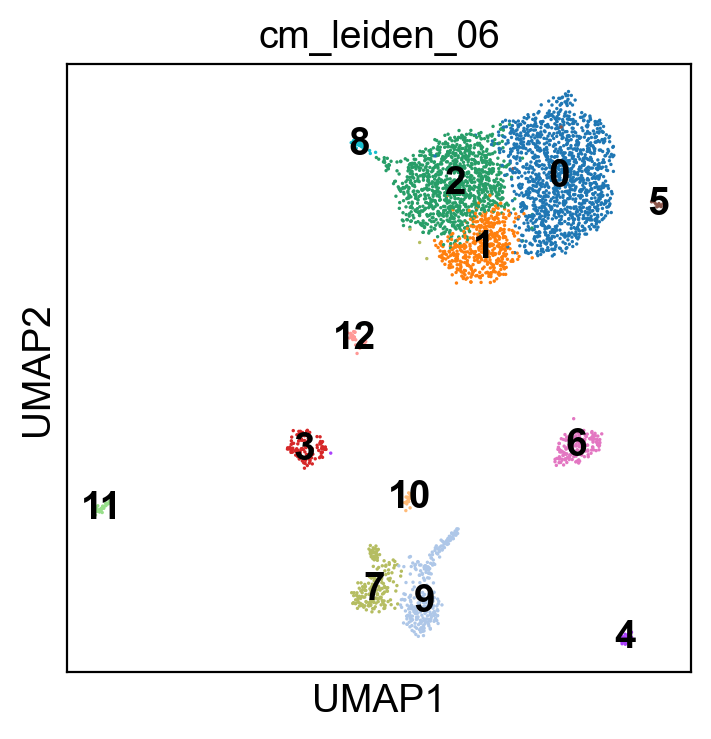

In [109]:
# Run Leiden clustering with the new neighbors graph
sc.tl.leiden(hm_adata, resolution=0.6, key_added="cm_leiden_06", flavor="igraph", directed=False, random_state=15, n_iterations = -1)

# Plot UMAP
sc.pl.umap(
    hm_adata, color=["cm_leiden_06"], legend_loc="on data", size=6
)

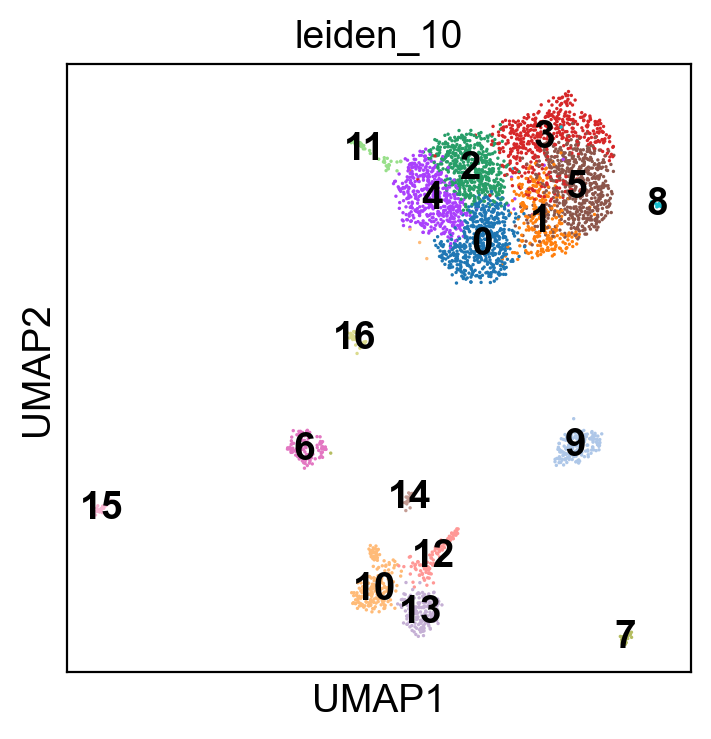

In [112]:
# Run Leiden clustering with the new neighbors graph
sc.tl.leiden(hm_adata, resolution=1.0, key_added="leiden_10", flavor="igraph", directed=False, random_state=15, n_iterations = -1)

# Plot UMAP
sc.pl.umap(
    hm_adata, color=["leiden_10"], legend_loc="on data", size=6
)

In [111]:
log_norm_adata = sc.read("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/lognorm_adata_pre_hvg.h5ad")

In [113]:
# 1️⃣ Transfer 'highly_variable' from clustered_adata.var to log_normalized_adata.var
log_norm_adata.var["highly_variable"] = False  # Initialize all as False

# Ensure only common genes are updated correctly
common_genes = hm_adata.var.index.intersection(log_norm_adata.var.index)
log_norm_adata.var.loc[common_genes, "highly_variable"] = hm_adata.var.loc[common_genes, "highly_variable"]

log_norm_adata.obs['leiden_10'] = hm_adata.obs['leiden_10']

# 2️⃣ Transfer 'cm_leiden_09_colors' & 'umap' from uns
log_norm_adata.uns["leiden_10_colors"] = hm_adata.uns["leiden_10_colors"]

# 3️⃣ Transfer 'X_pca_harmony' & 'X_umap' from obsm
log_norm_adata.obsm["X_pca_harmony"] = hm_adata.obsm["X_pca_harmony"]
log_norm_adata.obsm["X_umap"] = hm_adata.obsm["X_umap"]

In [114]:
log_norm_adata

AnnData object with n_obs × n_vars = 3759 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_10'
    var: 'Average_expression', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'Sample_ID_colors', 'log1p', 'leiden_10_colors'
    obsm: 'X_pca_harmony', 'X_umap'

In [116]:
clustered_myeloids_pig = sc.read ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/clustered_myeloids_pig.h5ad")

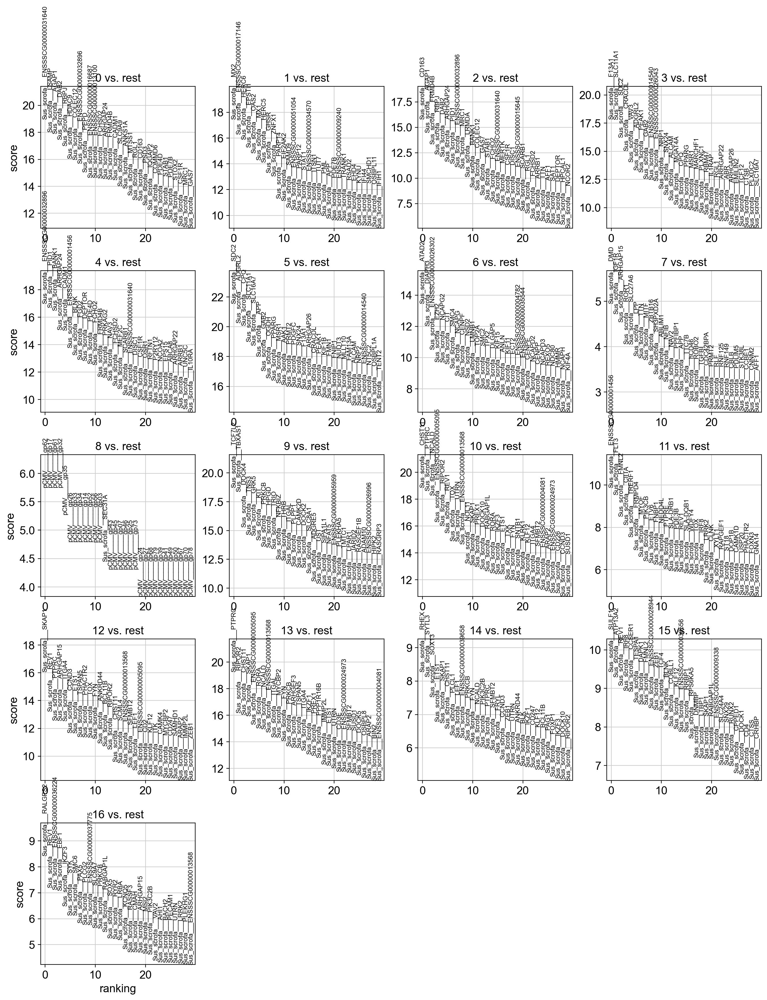

In [118]:
# Perform differential expression to find marker genes for each cluster using Wilcoxon test on raw data
sc.tl.rank_genes_groups(clustered_myeloids_pig, 'leiden_10', method='wilcoxon', key_added='wilcoxon')

# Visualize the top marker genes for each cluster
sc.pl.rank_genes_groups(clustered_myeloids_pig, key='wilcoxon', n_genes=30, sharey=False)

# Save the DE analysis to an H5AD file
dea_adata = clustered_myeloids_pig.write ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/dea_myeloids_pig.h5ad")

In [3]:
dea_adata = sc.read("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/dea_myeloids_pig.h5ad")

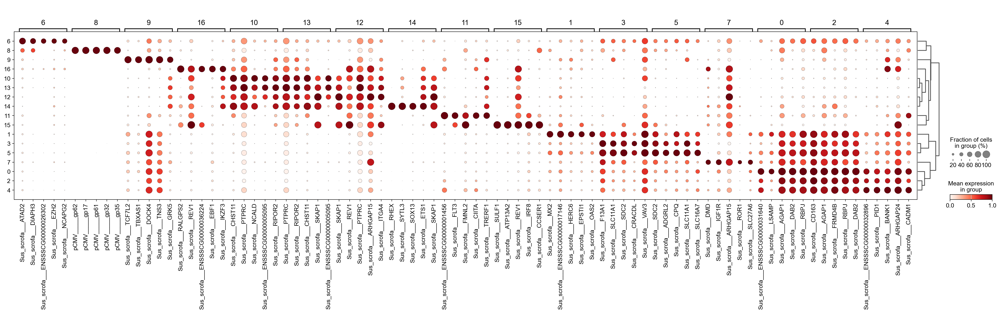

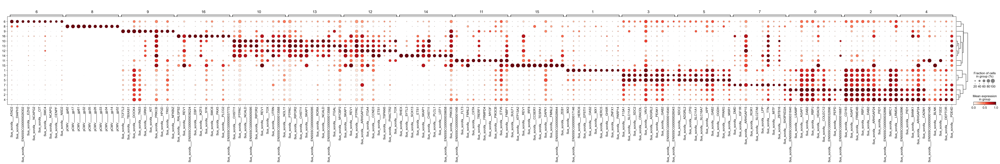

In [122]:
sc.pl.rank_genes_groups_dotplot(dea_adata, key="wilcoxon", n_genes=5, standard_scale="var"
                                # , cmap="coolwarm", vmin= -1
                               )
sc.pl.rank_genes_groups_dotplot(dea_adata, key="wilcoxon", n_genes=10, standard_scale="var"
                                # , cmap="coolwarm", vmin= -1
                               )

In [75]:
# Saving wilcoxon results directly
output_dir = '/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/'
os.makedirs(output_dir, exist_ok=True)  # Ensure the output directory exists

# Access the DE results stored in dea_adata.uns['wilcoxon']
de_results = dea_adata.uns['wilcoxon']

# Extract log-fold changes, p-values, and adjusted p-values
logfoldchanges = de_results['logfoldchanges']
pvals = de_results['pvals']
pvals_adj = de_results['pvals_adj']

# Loop through each cluster and save DEGs to a separate CSV file
for cluster in dea_adata.obs['leiden_10'].cat.categories:
    # Extract the top genes for the current cluster
    gene_names = de_results['names'][cluster]
    logfc = logfoldchanges[cluster]
    pval = pvals[cluster]
    adj_pval = pvals_adj[cluster]
    
    # Create a DataFrame for the cluster's DEGs
    degs_df = pd.DataFrame({
        'Gene': gene_names,
        'LogFoldChange': logfc,
        'PValue': pval,
        'AdjustedPValue': adj_pval
    })
    
    # Save the DataFrame to a CSV file
    output_file = os.path.join(output_dir, f"DEGs_cluster_{cluster}.csv")
    degs_df.to_csv(output_file, index=False)
    print(f"Saved DEGs for cluster {cluster} to {output_file}")

Saved DEGs for cluster 0 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/DEGs_cluster_0.csv
Saved DEGs for cluster 1 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/DEGs_cluster_1.csv
Saved DEGs for cluster 2 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/DEGs_cluster_2.csv
Saved DEGs for cluster 3 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/DEGs_cluster_3.csv
Saved DEGs for cluster 4 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/DEGs_cluster_4.csv
Saved DEGs for cluster 5 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/DEGs_cluster_5.csv
Saved DEGs for cluster 6 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/DEGs_cluster_6.csv
Saved DEGs for cluster 7 to /data2/core-med1/nhadizad/n

In [78]:
import os
import pandas as pd

# Set output directory
output_dir = '/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/Filtered degs'
os.makedirs(output_dir, exist_ok=True)

# Access DE results from Wilcoxon test
de_results = dea_adata.uns['wilcoxon']

# Extract required statistics
logfoldchanges = de_results['logfoldchanges']
pvals = de_results['pvals']
pvals_adj = de_results['pvals_adj']

# Loop through each cluster and filter + save DEGs
for cluster in dea_adata.obs['leiden_10'].cat.categories:
    gene_names = de_results['names'][cluster]
    logfc = logfoldchanges[cluster]
    pval = pvals[cluster]
    adj_pval = pvals_adj[cluster]

    # Create DataFrame
    degs_df = pd.DataFrame({
        'Gene': gene_names,
        'LogFoldChange': logfc,
        'PValue': pval,
        'AdjustedPValue': adj_pval
    })

    # Apply filtering
    degs_filtered = degs_df[(degs_df['LogFoldChange'] > 0.75) & (degs_df['PValue'] < 0.05)]

    # Save to CSV
    output_file = os.path.join(output_dir, f"Filtered_DEGs_cluster_{cluster}.csv")
    degs_filtered.to_csv(output_file, index=False)
    print(f"Saved filtered DEGs for cluster {cluster} to {output_file}")


Saved filtered DEGs for cluster 0 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/Filtered degs/Filtered_DEGs_cluster_0.csv
Saved filtered DEGs for cluster 1 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/Filtered degs/Filtered_DEGs_cluster_1.csv
Saved filtered DEGs for cluster 2 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/Filtered degs/Filtered_DEGs_cluster_2.csv
Saved filtered DEGs for cluster 3 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/Filtered degs/Filtered_DEGs_cluster_3.csv
Saved filtered DEGs for cluster 4 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/Filtered degs/Filtered_DEGs_cluster_4.csv
Saved filtered DEGs for cluster 5 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/Filtered degs/Filtered_DEGs_cluster_5.cs

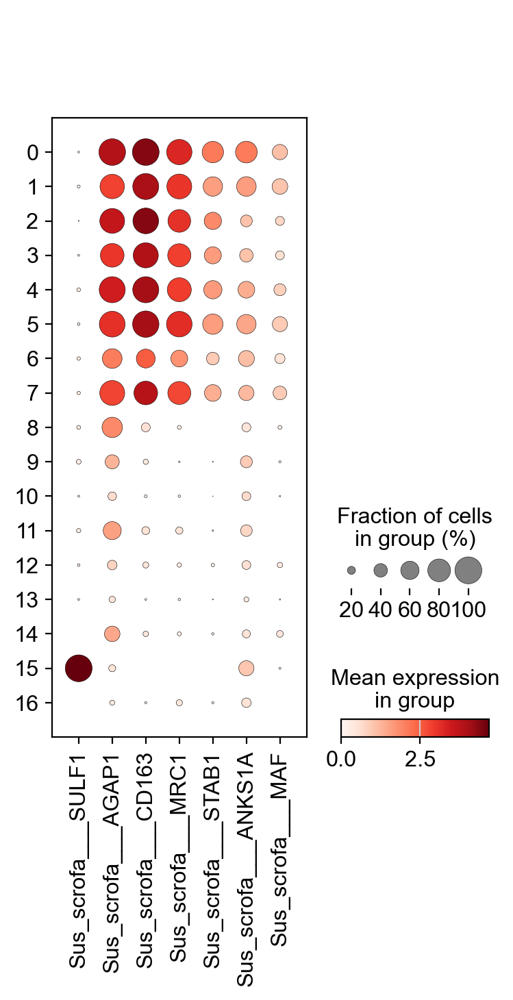

In [135]:
LYVE1_MAC_genes = ["Sus_scrofa___SULF1", "Sus_scrofa___AGAP1", "Sus_scrofa___CD163", "Sus_scrofa___MRC1", "Sus_scrofa___STAB1", "Sus_scrofa___ANKS1A", "Sus_scrofa___MAF"]

# Create the dot plot
sc.pl.dotplot(dea_adata, LYVE1_MAC_genes, groupby='leiden_10', vmin=0)

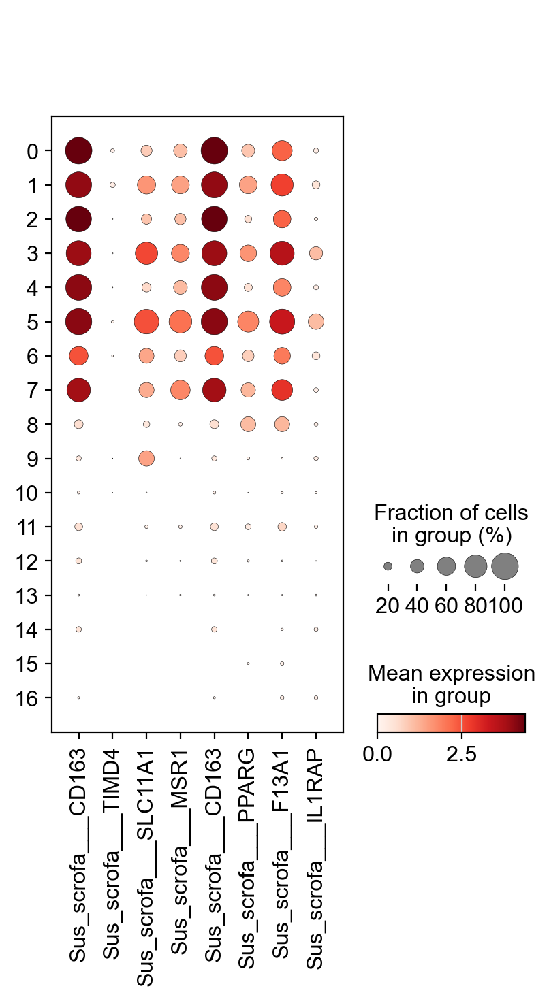

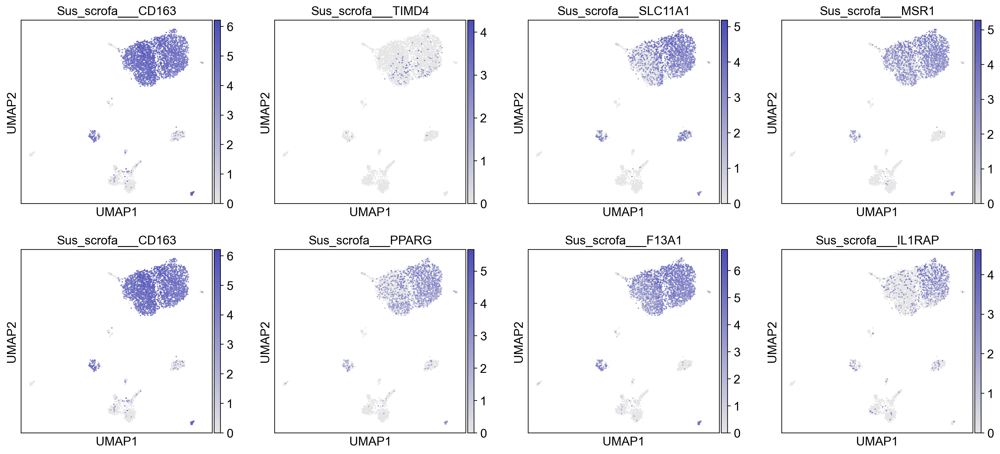

In [132]:

M2_genes = [
    "Sus_scrofa___CD163", "Sus_scrofa___TIMD4", "Sus_scrofa___SLC11A1", "Sus_scrofa___MSR1",
                  "Sus_scrofa___CD163", "Sus_scrofa___PPARG", "Sus_scrofa___F13A1", "Sus_scrofa___IL1RAP",
                ]

# Create the dot plot
sc.pl.dotplot(dea_adata, M2_genes, groupby='leiden_10', vmin=0)

sc.pl.umap(dea_adata, color=M2_genes, cmap=dimplot_color, size=10)

In [9]:
cluster_annotations = {
    "0": "Sus_MP1",
    "1": "Sus_MP2",   #actually MP2 ISG
    "2": "Sus_MP1",
    "3": "Sus_MP2",
    "4": "Sus_MP1",
    "5": "Sus_MP2",
    "6": "Sus_prolif_immune",
    "7": "Sus_unassigned",
    "8": "Sus_pCMV_immune",
    "9": "Sus_MO_CD16",
    "10": "Sus_NK",
    "11": "Sus_DC",
    "12": "Sus_CD4/CD8+lymphoids",
    "13": "Sus_CD4/CD8+lymphoids",
    "14": "Sus_CD4/CD8+lymphoids",
    "15": "Sus_unclassified",    #= CD4+ T helper cells (prev. B-cell like)
    "16": "Sus_B_cells"
}

In [10]:
# Add the manual annotations to the 'dea_adata' object
dea_adata.obs["pig_immune_leiden_10"] = dea_adata.obs.leiden_10.astype(str).map(cluster_annotations)

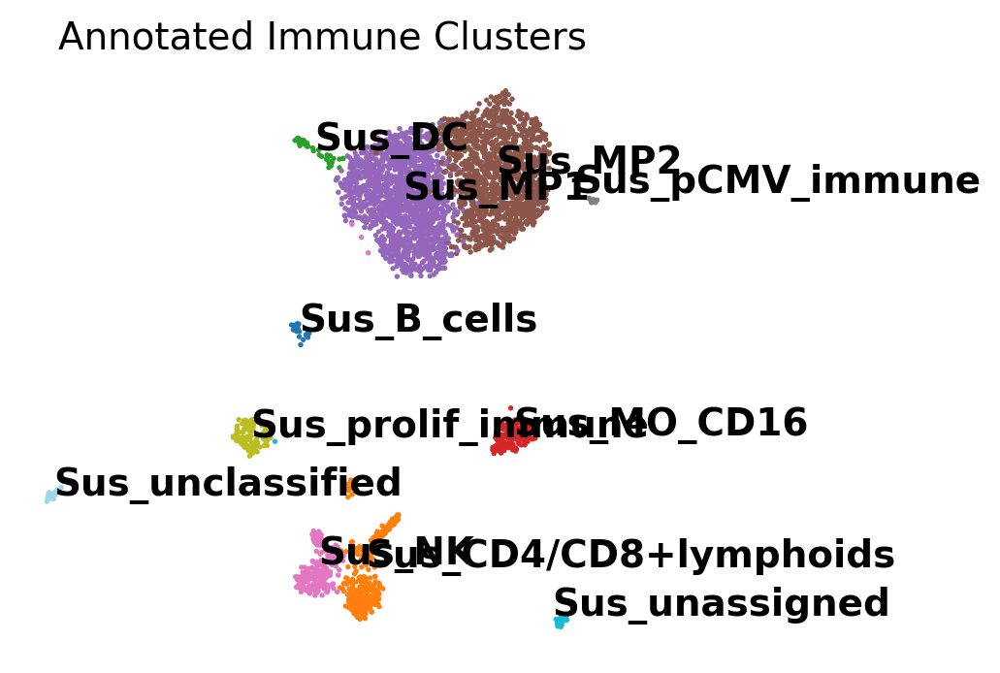

In [12]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# Plot UMAP without on-data legend
sc.pl.umap(
    dea_adata,
    color="pig_immune_leiden_10",
    palette="tab20",
    legend_loc=None,  # No legend on data
    title="Annotated Immune Clusters",
    frameon=False,
    size=15,
    show=False
)

ax = plt.gca()

umap = dea_adata.obsm["X_umap"]
clusters = dea_adata.obs["pig_immune_leiden_10"]

for cat in clusters.cat.categories:
    idx = clusters == cat
    x = umap[idx, 0].mean()
    y = umap[idx, 1].mean()

    # Custom y-offsets for overlapping clusters (example)
    if cat == "CD4+ & CD8+ T-cells":
        y += 1.0
    elif cat == "T-cell like (CD3-)":
        y -= 1.0

    # Plot label with no background box
    ax.text(
        x, y, cat,
        fontsize=14, fontweight="bold",
        color='black'
        # No bbox argument here!
    )

plt.show()


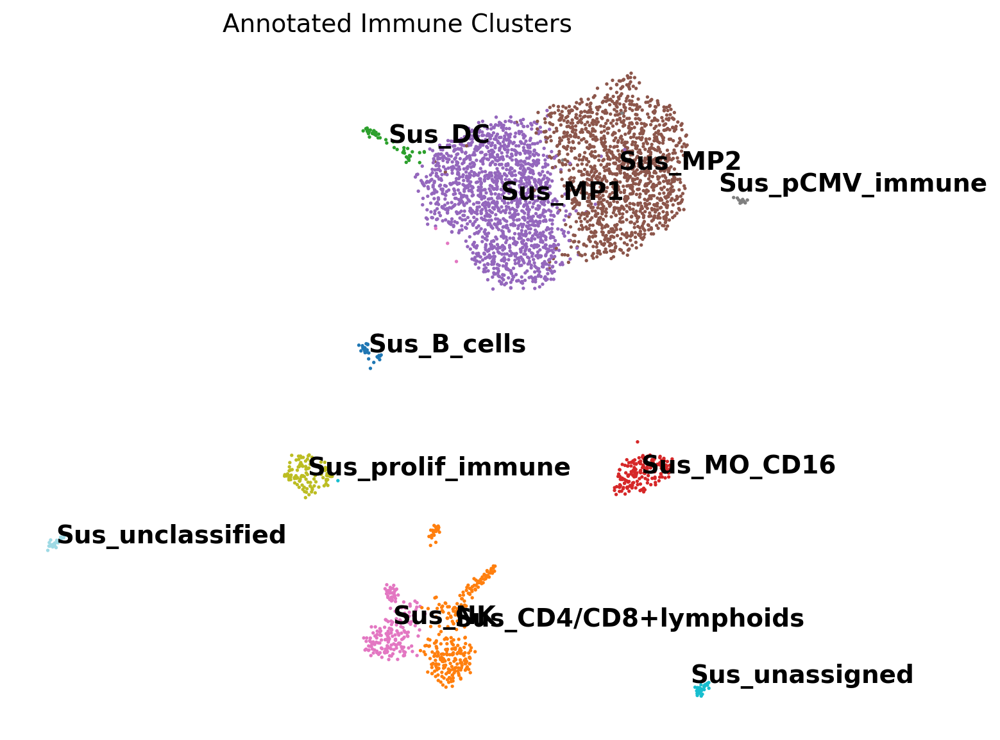

In [13]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

# Set wider figure size BEFORE plotting
fig, ax = plt.subplots(figsize=(8, 6))  # <- increase width and height here

# Plot UMAP
sc.pl.umap(
    dea_adata,
    color="pig_immune_leiden_10",
    palette="tab20",
    legend_loc=None,
    title="Annotated Immune Clusters",
    frameon=False,
    size=15,
    ax=ax,  # <- assign your custom axis
    show=False
)

umap = dea_adata.obsm["X_umap"]
clusters = dea_adata.obs["pig_immune_leiden_10"]

# Add labels
for cat in clusters.cat.categories:
    idx = clusters == cat
    x = umap[idx, 0].mean()
    y = umap[idx, 1].mean()

    # Adjust label positions manually if needed
    if cat == "CD4/CD8+ T-cells":
        y += 1.0
    elif cat == "NK cells":
        y -= 1.0

    ax.text(
        x, y, cat,
        fontsize=14, fontweight="bold",
        color='black'
    )

plt.tight_layout()
plt.show()


In [16]:
final_pig_immune_annotation = dea_adata.write ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/final objects/final_pig_immune_annotation.h5ad")

In [3]:
final_pig_immune_annotation = sc.read ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/final objects/final_pig_immune_annotation.h5ad")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


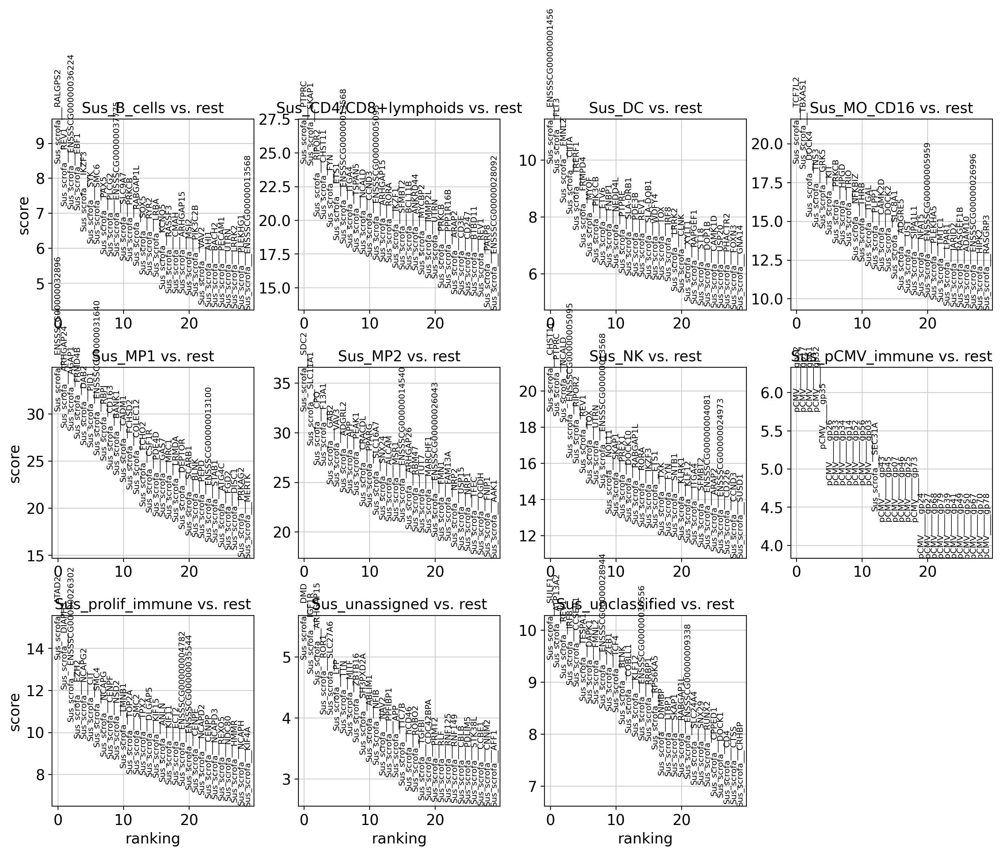

In [4]:
# Perform differential expression to find marker genes for each cluster using Wilcoxon test on raw data
sc.tl.rank_genes_groups(final_pig_immune_annotation, 'pig_immune_leiden_10', method='wilcoxon', key_added='ann_wilcoxon')

# Visualize the top marker genes for each cluster
sc.pl.rank_genes_groups(final_pig_immune_annotation, key='ann_wilcoxon', n_genes=30, sharey=False)

# Save the DE analysis to an H5AD file
annotated_dea_adata = final_pig_immune_annotation.write ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/annotated_dea_myeloids_pig.h5ad")

In [5]:
annotated_dea_adata = sc.read("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/annotated_dea_myeloids_pig.h5ad")

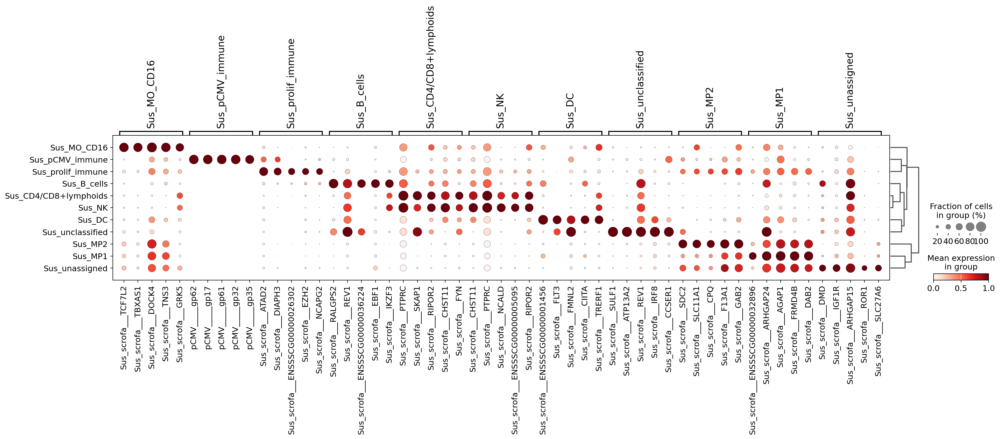

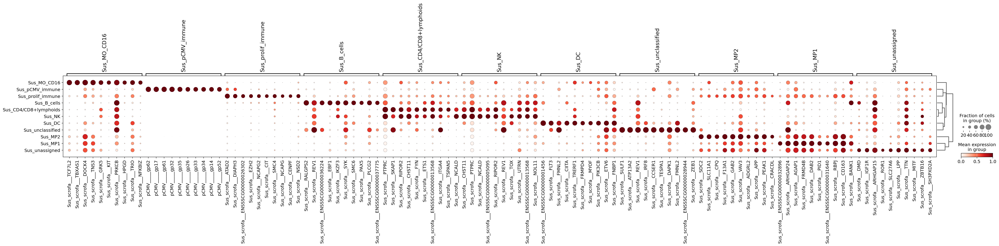

In [6]:
sc.pl.rank_genes_groups_dotplot(annotated_dea_adata, key="ann_wilcoxon", n_genes=5, standard_scale="var"
                                # , cmap="coolwarm", vmin= -1
                               )
sc.pl.rank_genes_groups_dotplot(annotated_dea_adata, key="ann_wilcoxon", n_genes=10, standard_scale="var"
                                # , cmap="coolwarm", vmin= -1
                               )

In [20]:
# Saving wilcoxon results directly
output_dir = '/data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/annotated degs/'
os.makedirs(output_dir, exist_ok=True)  # Ensure the output directory exists

# Access the DE results stored in dea_adata.uns['wilcoxon']
de_results = annotated_dea_adata.uns['ann_wilcoxon']

# Extract log-fold changes, p-values, and adjusted p-values
logfoldchanges = de_results['logfoldchanges']
pvals = de_results['pvals']
pvals_adj = de_results['pvals_adj']

# Loop through each cluster and save DEGs to a separate CSV file
for cluster in annotated_dea_adata.obs['pig_immune_leiden_10'].cat.categories:
    # Extract the top genes for the current cluster
    gene_names = de_results['names'][cluster]
    logfc = logfoldchanges[cluster]
    pval = pvals[cluster]
    adj_pval = pvals_adj[cluster]
    
    # Create a DataFrame for the cluster's DEGs
    degs_df = pd.DataFrame({
        'Gene': gene_names,
        'LogFoldChange': logfc,
        'PValue': pval,
        'AdjustedPValue': adj_pval
    })
    
    # Save the DataFrame to a CSV file
    output_file = os.path.join(output_dir, f"DEGs_cluster_{cluster}.csv")
    degs_df.to_csv(output_file, index=False)
    print(f"Saved DEGs for cluster {cluster} to {output_file}")

Saved DEGs for cluster B cells to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/annotated degs/DEGs_cluster_B cells.csv
Saved DEGs for cluster CD4+ & CD8+ T-cells to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/annotated degs/DEGs_cluster_CD4+ & CD8+ T-cells.csv
Saved DEGs for cluster CD16+ monocytes to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/annotated degs/DEGs_cluster_CD16+ monocytes.csv
Saved DEGs for cluster Dendritic cells to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/annotated degs/DEGs_cluster_Dendritic cells.csv
Saved DEGs for cluster Doublet (TNT, COL3A1, DMD, MYO1E, ...) to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Finns objects/Pig immune reclustering/annotated degs/DEGs_cluster_Doublet (TNT, COL3A1, DMD, MYO1E, ...).csv
Saved DEGs for cluster MP1 to /data2/core-med1/nhadizad/nastaran/Xenotra

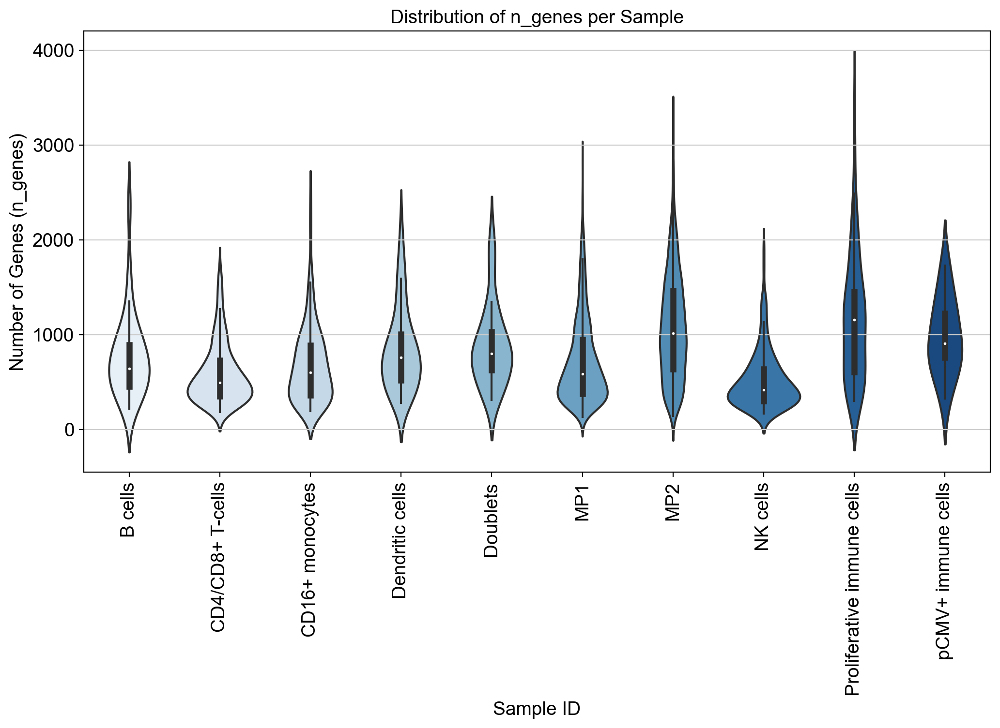

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create violin plot for n_genes per Sample_ID
plt.figure(figsize=(12, 6))
sns.violinplot(x=annotated_dea_adata.obs["pig_immune_leiden_10"], y=annotated_dea_adata.obs["n_genes"], palette="Blues")

# Titles and labels
plt.xticks(rotation=90)
plt.xlabel("Sample ID")
plt.ylabel("Number of Genes (n_genes)")
plt.title("Distribution of n_genes per Sample")

# Show plot
plt.show()


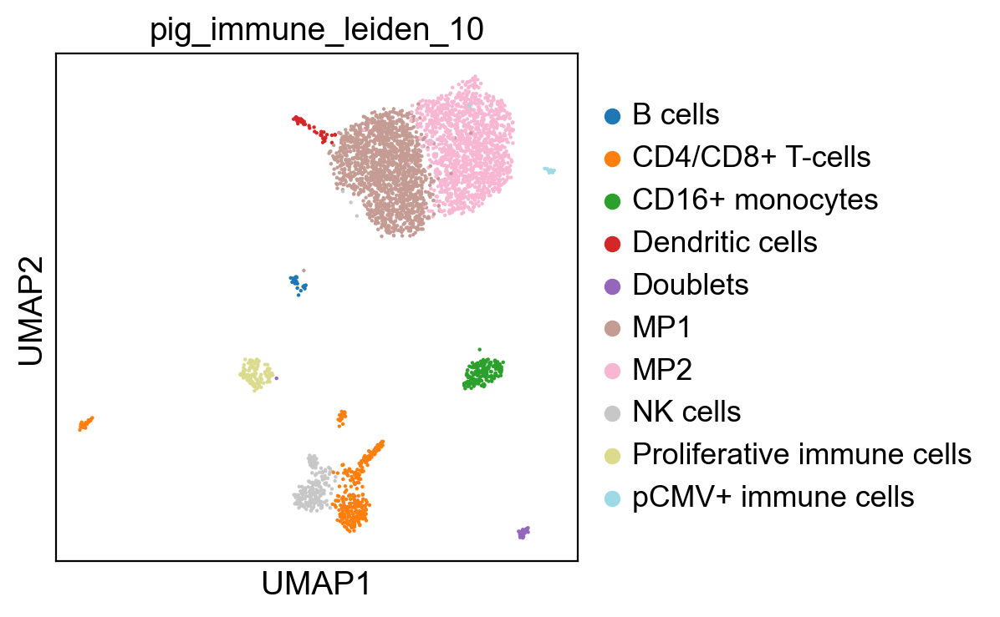

In [71]:
sc.pl.umap(annotated_dea_adata, color=['pig_immune_leiden_10'], cmap=dimplot_color, size=10)

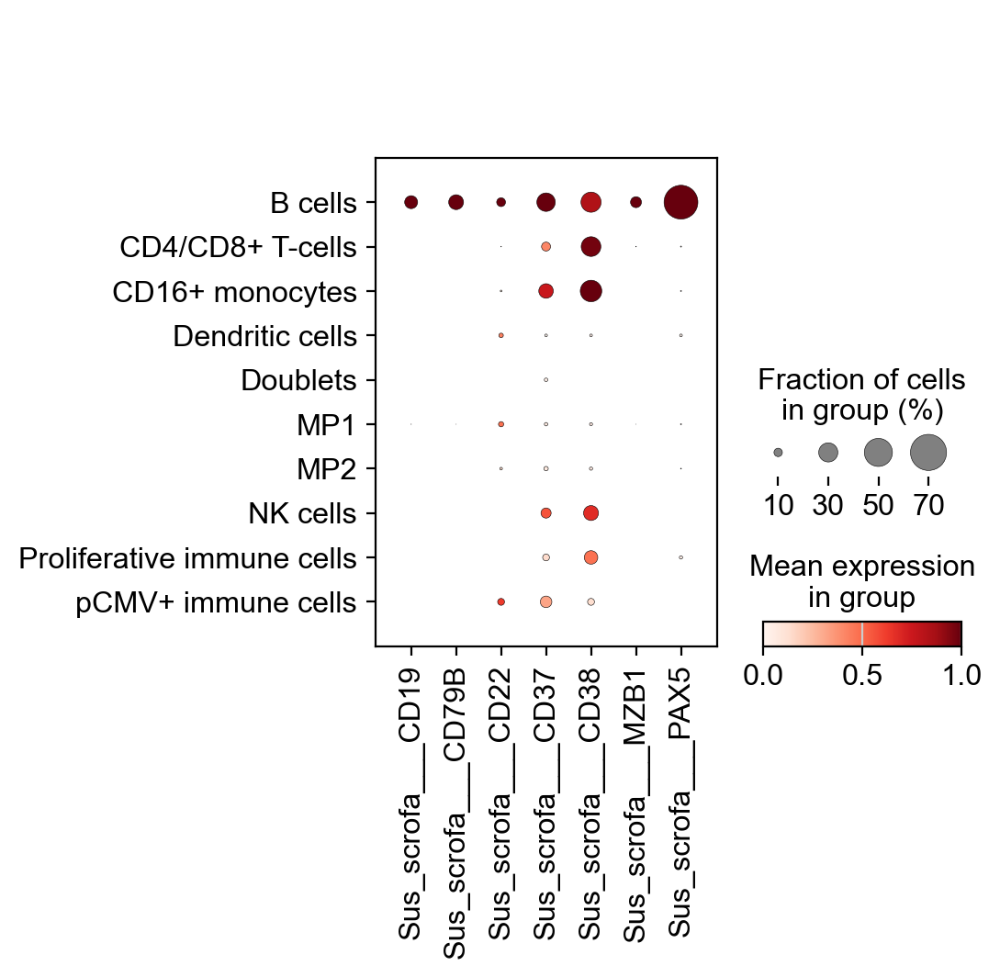

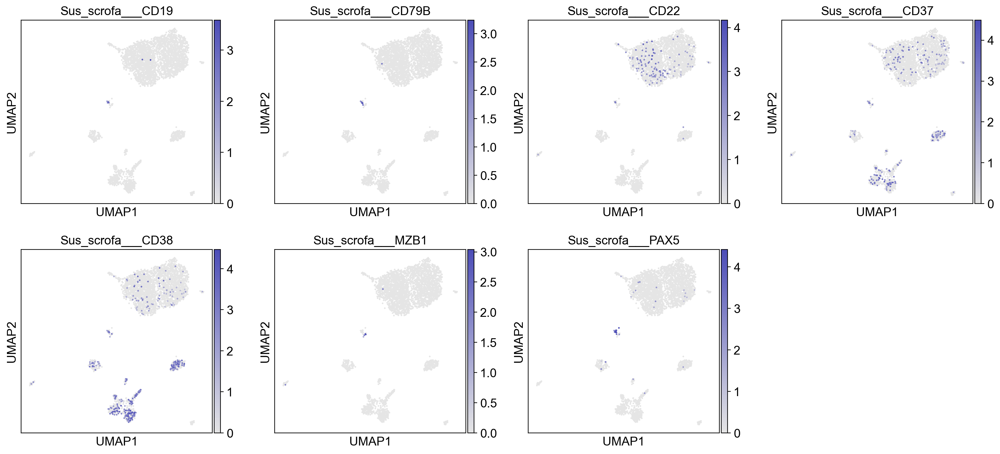

In [72]:
B_cell_genes = ["Sus_scrofa___CD19", "Sus_scrofa___CD79B",
        "Sus_scrofa___CD22", "Sus_scrofa___CD37",
        "Sus_scrofa___CD38",
        "Sus_scrofa___MZB1", "Sus_scrofa___PAX5"
        ]

# Create the dot plot
sc.pl.dotplot(annotated_dea_adata, B_cell_genes, groupby='pig_immune_leiden_10', vmin=0, standard_scale = 'var')

sc.pl.umap(annotated_dea_adata, color=B_cell_genes, cmap=dimplot_color, size=14)

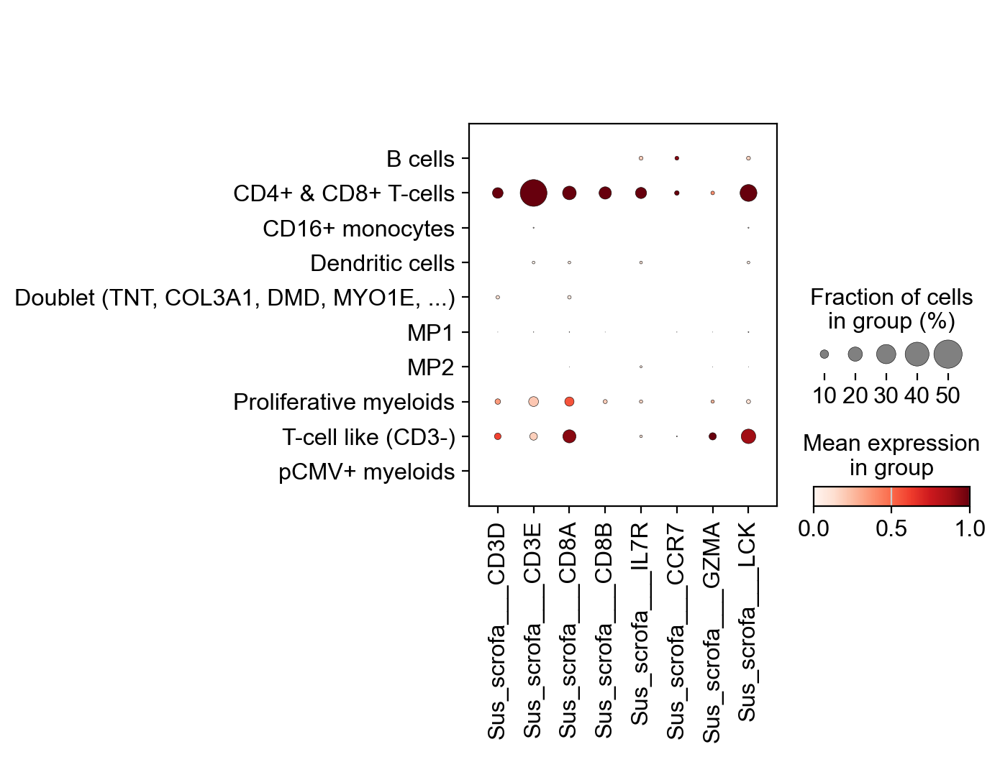

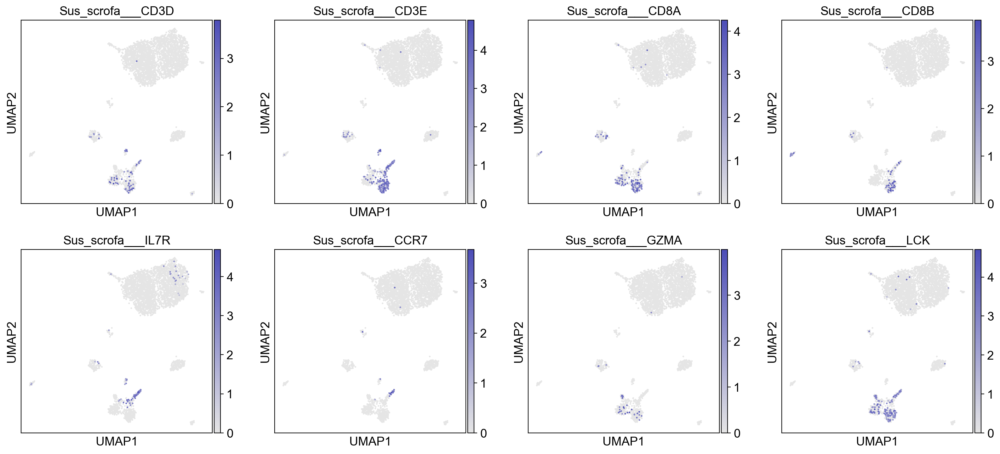

In [7]:
genes = [
    "Sus_scrofa___CD3D",
         "Sus_scrofa___CD3E",
        "Sus_scrofa___CD8A",
        "Sus_scrofa___CD8B",
        "Sus_scrofa___IL7R",
        "Sus_scrofa___CCR7",
        "Sus_scrofa___GZMA",
            "Sus_scrofa___LCK"
        ]

# Create the dot plot
sc.pl.dotplot(annotated_dea_adata, genes, groupby='pig_immune_leiden_10', vmin=0, standard_scale = 'var')

sc.pl.umap(annotated_dea_adata, color=genes, cmap=dimplot_color, size=14, vmin = 0)